## Notebook used to understand the data

In [1]:
import numpy as np
import astropy as ap
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from astropy.table import QTable
import astropy.units as u

a = np.array([1, 4, 5], dtype=np.int32)
b = [2.0, 5.0, 8.5]
c = ['x', 'y', 'z']
d = [10, 20, 30] * u.m / u.s

t = QTable([a, b, c, d],
           names=('a', 'b', 'c', 'd'),
           meta={'name': 'first table'})

In [3]:
t.info

<QTable length=3>
name  dtype   unit  class  
---- ------- ----- --------
   a   int32         Column
   b float64         Column
   c    str1         Column
   d float64 m / s Quantity

In [ ]:
with open("data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.txt", 'r') as f:
    lines = f.readlines()

print(len(lines))

for i in range(0, 5000, 1):
    print(lines[i])


104336
# MIST version number  = 1.2     

# MESA revision number =     7503

# --------------------------------------------------------------------------------------

#  Yinit        Zinit   [Fe/H]   [a/Fe]  v/vcrit                                        

# 0.2557  4.51753E-03    -0.50     0.00     0.00

# --------------------------------------------------------------------------------------

# number of isochrones =   107

# --------------------------------------------------------------------------------------

# number of EEPs, cols =   264   25

#   1                               2                               3                               4                               5                               6                               7                               8                               9                              10                              11                              12                              13                              14                       

l'âge de l'isochrone commence à 100 000 ans et augmente de ~12 000 ans à chaque incrément jusqu'à atteindre 1.99526e+10 ans (19.9526 milliards d'années)

le nombre de EEP (equivalent evolutionary point) tracks par isochrone augmente à chaque incrément du log10 de l'âge, pourquoi?


### Données intéressantes

- dans nom du fichier : [Fe/H] => la métallicité (le paramètre qui change entre tous les fichiers, de +0.50 à -4.00)
- colonne 2 : log10_isochrone_age_yr => âge de l'isochrone en log années
- (colonne 4 : star_mass => masse de l'étoile en masse solaire (masse juqu'à 3-5 nous intéresse))
- (colonne 8 : log_L => log luminosité bolométrique en luminosité solaire)
- colonne 11 : log_Teff => log température effective en Kelvin
- colonne 13 : log_g => log gravité de surface en cm*s<sup>-2</sup>
- (colonne 25 : phase => le type de phase de l'étoile défini par : -1=PMS, 0=MS, 2=RGB, 3=CHeB, 4=EAGB, 5=TPAGB, 6=postAGB, 9=WR)

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.txt
[3.49658903 3.49668886 3.49822443 ... 4.7017784  4.69415116 4.68655345]


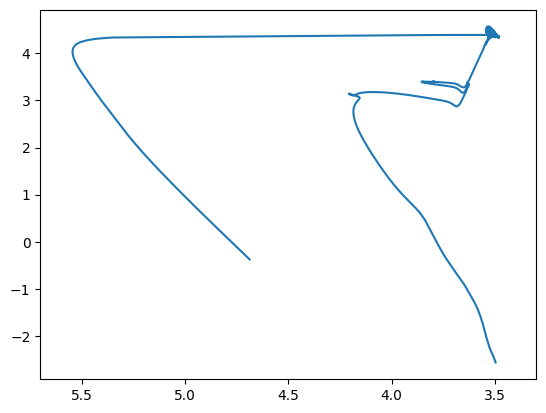

In [ ]:
import read_mist_models

iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.txt')

age_ind = iso.age_index(8.0)

logTeff = iso.isos[age_ind]['log_Teff']
print(logTeff)

logL = iso.isos[age_ind]['log_L']

plt.xlim(5.8, 3.2)
plt.plot(logTeff, logL)

plt.show()

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt


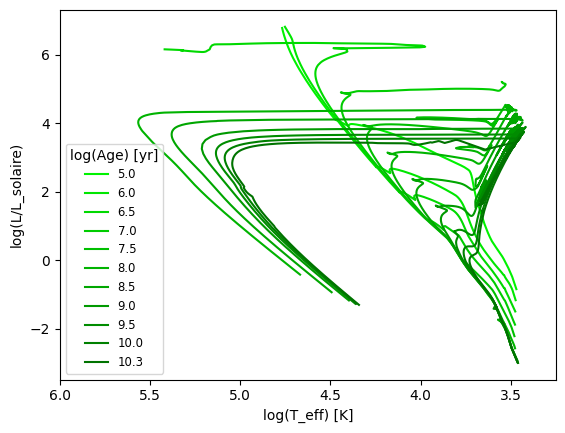

In [129]:
import read_mist_models

iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

ages = [5.0, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0, 10.3]
colors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55]
# utiliser ça (https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range) pour normaliser si besoin

for i, age in enumerate(ages):
    age_ind = iso.age_index(age)
    logTeff = iso.isos[age_ind]['log_Teff']
    # print(age_ind)
    # print(iso.isos[age_ind])
    # print(iso.isos[age_ind]['log_Teff'])
    # break
    
    logL = iso.isos[age_ind]['log_L']

    plt.plot(logTeff, logL, label=f"{age}", c=(0, # 0.5-colors[i] if 0.5-colors[i]>0 else 0,
                                               1-colors[i], # 0.5-colors[i] if 0.5-colors[i]>0 else 0, 
                                               0))

plt.xlim(6, 3.25)
plt.xlabel("log(T_eff) [K]")
plt.ylabel("log(L/L_solaire)")
plt.legend(title="log(Age) [yr]", fontsize="small")
plt.show()

faire le graphe avec d'autres couleurs pour les phases

In [ ]:
import read_mist_models

iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

masses = [0.1, 0.4, 0.8, 1.5, 2.4, 4.0, 8.0, 16.0, 30.0, 60.0, 100.0, 250.0]
colors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55, 0.6]
# utiliser ça (https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range) pour normaliser si besoin

for i, mass in enumerate(masses): # TODO, itérer dans tous les isochrones et prendre les valuers de L et T_eff pour chaque masse
    age_ind = iso.age_index(age)
    logTeff = iso.isos[age_ind]['log_Teff']

    logL = iso.isos[age_ind]['log_L']

    plt.plot(logTeff, logL, label=f"{age}", c=(1-colors[i], # 0.5-colors[i] if 0.5-colors[i]>0 else 0,
                                               0, # 0.5-colors[i] if 0.5-colors[i]>0 else 0, 
                                               0))

plt.xlim(6, 3.25)
plt.xlabel("log(T_eff) [K]")
plt.ylabel("log(L/L_solaire)")
plt.legend(title="log(Age) [yr]", fontsize="small")
plt.show()

In [102]:
iso_test = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.50_afe_p0.0_vvcrit0.0_basic.txt')

infos = iso_test.read_iso_file()

for data in infos:
    print(data)

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.50_afe_p0.0_vvcrit0.0_basic.txt
{'MIST': '1.2', 'MESA': '7503'}
{'Yinit': 0.3163, 'Zinit': 0.0451753, '[Fe/H]': 0.5, '[a/Fe]': 0.0}
0.0
[5.0, 5.05, 5.1, 5.15, 5.2, 5.25, 5.3, 5.35, 5.4, 5.45, 5.5, 5.55, 5.6, 5.65, 5.7, 5.75, 5.8, 5.8500000000000005, 5.9, 5.95, 6.0, 6.050000000000001, 6.1000000000000005, 6.15, 6.2, 6.25, 6.300000000000001, 6.3500000000000005, 6.4, 6.45, 6.5, 6.550000000000001, 6.6000000000000005, 6.65, 6.7, 6.75, 6.800000000000001, 6.8500000000000005, 6.9, 6.95, 7.0, 7.050000000000001, 7.1000000000000005, 7.15, 7.200000000000001, 7.25, 7.300000000000001, 7.3500000000000005, 7.4, 7.450000000000001, 7.5, 7.550000000000001, 7.6000000000000005, 7.65, 7.700000000000001, 7.75, 7.800000000000001, 7.8500000000000005, 7.9, 7.950000000000001, 8.0, 8.05, 8.100000000000001, 8.15, 8.200000000000001, 8.25, 8.3, 8.350000000000001, 8.4, 8.450000000000001, 8.5, 8.55, 8.600000000000001, 8.65, 8.700000000000001, 8.75, 8.8, 8